# **Deteksi Imunopositivitas dan Kuantifikasi Indeks Ki-67 pada Glioma dengan Pendekatan *Deep Learning* Berbasis *Mask Region-Based Convolutional Network* (Mask R-CNN)**

Oleh: **dr. Dewa Nyoman Murti Adyaksa**
NIM: 17/422724/PKU/17178
PPDS Patologi Anatomik FK-KMK UGM

Pembimbing:
*   **Ir. Hanung Adi Nugroho, Ph.D, IPM**
*   **dr. Ery Kus Dwianingsih, Ph.D, Sp.PA(K)**

Penguji:
*   **Dr. dr. Ahmad Ghozali, Sp.PA(K)**
*   **dr. Rusdy Ghazali Malueka, Ph.D, Sp.N(K)**

# A. **Konfigurasi** (Konfigurasi Eksperimen)

Rutin untuk mengimpor dependencies eksperimen

In [ ]:
import os
import sys
import json
import numpy as np
import time
from PIL import Image, ImageDraw
import skimage.draw
import random

Kloning repositori tesis https://github.com/sakhadyaksa/thesis

In [ ]:
!git clone https://github.com/sakhadyaksa/thesis.git

Cloning into 'thesis'...
remote: Enumerating objects: 32, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 32 (delta 4), reused 22 (delta 1), pack-reused 0
Unpacking objects: 100% (32/32), done.


# B. **Instalasi** (Instalasi Mask-R-CNN)

In [ ]:
cd thesis/

/content/thesis


In [ ]:
!python setup.py install

/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:694: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:694: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:694: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writing manifest file 'ma

# C. **Parameter Training** (Konfigurasi Parameter Training)

In [ ]:
ROOT_DIR = '/content/thesis'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist'

sys.path.append(ROOT_DIR) 

from mrcnn import visualize
from mrcnn.config import Config
from mrcnn import model as modellib, utils

Lokasi direktori berkas log dan model



In [ ]:
# Lokasi Penyimpanan Log dan Model Hasil Training
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Lokasi Model COCO pre-trained 
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Alternatif jika error maka langsung unduh pretrained model COCO nya
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

... done downloading pretrained model!


Backbone eksperimen menggunakan **ResNet101**

In [ ]:
class CustomConfig(Config):
 
    # Nama Konfigurasi
    NAME = "object"
 
    # Konfigurasi 1 GPU 12GB dari Google (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
 
    # Konfigurasi 3 Kelas BG Sel Imunopositif dan Negatif
    NUM_CLASSES = 1 + 2  # latar belakang + imunopositif dan negatif
 
    # Ukuran Training Slider - Eksperimen dari 128 px-512px
    IMAGE_MIN_DIM = 512 #128
    IMAGE_MAX_DIM = 512 #128
 
    # Jumlah Step per Epoch - Sementara Training Menggunakan 500 Steps
    STEPS_PER_EPOCH = 500
 
    # Jumlah Langkah Validasi - Nilai Akan Dinaikkan Jika Disk Penuh
    VALIDATION_STEPS = 5
    
    #DETECTION_MIN_CONFIDENCE = 0 #Eksperimen
 
    # Balung Mburine hehehehe - Digunakan BackBone ResNet50
    BACKBONE = 'resnet101'
 
    # Parameter Eksperimen
    #IMAGE_RESIZE_MODE = "crop"
    #IMAGE_MIN_DIM = 512
    #IMAGE_MAX_DIM = 512
    #IMAGE_MIN_SCALE = 2.0
 
    # Konfigurasi Jangkar RPN - Karena Objek Kecil Digunakan 8 16 32 64 128
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32 #1
    MAX_GT_INSTANCES = 50 #200 
    #POST_NMS_ROIS_INFERENCE = 2000 #500 
    #POST_NMS_ROIS_TRAINING = 1000 
 
    # Parameter Eksperimen
    #RPN_NMS_THRESHOLD = 0.9
    #RPN_TRAIN_ANCHORS_PER_IMAGE = 64
    #MEAN_PIXEL = np.array([43.53, 39.56, 48.22])
    #USE_MINI_MASK = True
    #MINI_MASK_SHAPE = (56, 56)
    
    #DETECTION_MAX_INSTANCES = 400
    
config = CustomConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

# D. **Konfigurasi Target Deteksi** (Konfigurasi Kelas Imunopositif dan Imunonegatif)

In [ ]:
class CustomDataset(utils.Dataset):
 
    def load_custom(self, dataset_dir, subset):

        # Multiclass untuk deteksi sel tumor imunopositif dan negatif
        self.add_class("object", 1, "imunopositif")
        self.add_class("object", 2, "imunonegatif")
 
        # Training dan validation dataset
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)
 
        annotations1 = json.load(open(os.path.join(dataset_dir, "via_region_data.json")))
        # print(annotations1)
        annotations = list(annotations1.values())
 
        annotations = [a for a in annotations if a['regions']]
 
        for a in annotations:
          
            polygons = [r['shape_attributes'] for r in a['regions'].values()]
            objects = [s['region_attributes']['tumor'] for s in a['regions'].values()]
            name_dict = {"imunopositif": 1,"imunonegatif": 2}
            num_ids = [name_dict[a] for a in objects]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]
 
            self.add_image(
                "object", 
                image_id=a['filename'], 
                path=image_path,
                width=width, height=height,
                polygons=polygons,
                num_ids=num_ids)
 
    def load_mask(self, image_id):

        image_info = self.image_info[image_id]
        if image_info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
 
        info = self.image_info[image_id]
        if info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
        num_ids = info['num_ids']
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
 
        num_ids = np.array(num_ids, dtype=np.int32)
        return mask, num_ids
 
    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "object":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)
 

Lokasi direktori dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Dataset Training
dataset_train = CustomDataset()
dataset_train.load_custom("/content/drive/MyDrive/Thesis Spesialis-1/dataset512", "train")
dataset_train.prepare()

# Dataset Validasi
dataset_val = CustomDataset()
dataset_val.load_custom("/content/drive/MyDrive/Thesis Spesialis-1/dataset512", "val")
dataset_val.prepare()

# E. **Training** 

Mengeset model ke mode training

In [ ]:
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.


In [ ]:
init_with = "coco"  # imagenet, coco, last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":

    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":

    model.load_weights(model.find_last(), by_name=True)

Rutin untuk menampilkan contoh ground truth 

14
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/15.jpg


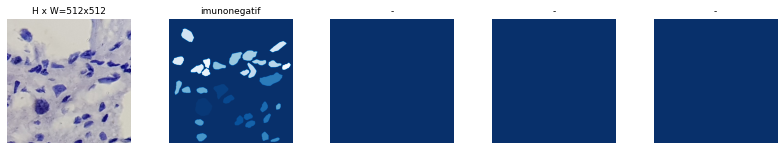

60
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/61.jpg


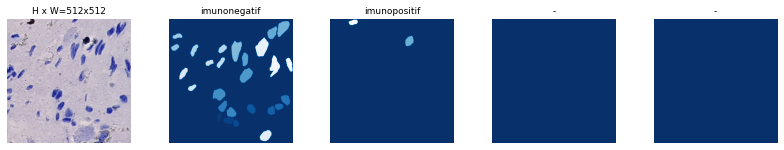

89
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/90.jpg


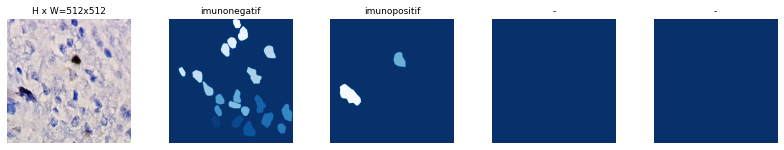

42
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/43.jpg


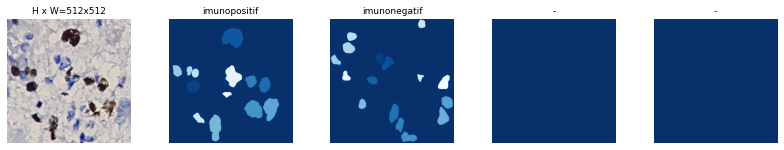

49
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/50.jpg


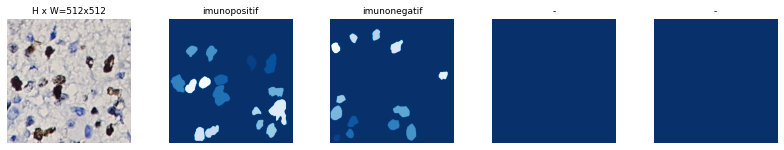

14
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/15.jpg


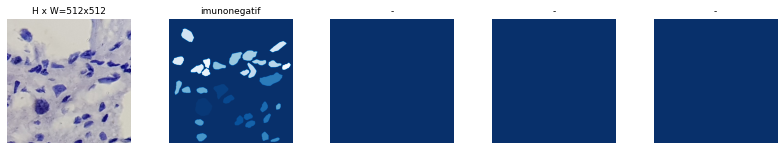

60
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/61.jpg


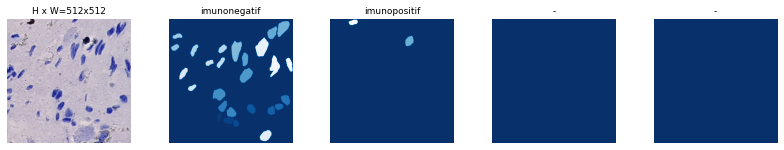

86
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/87.jpg


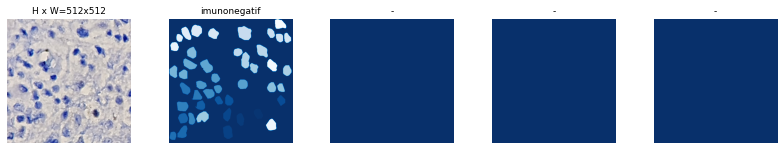

54
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/55.jpg


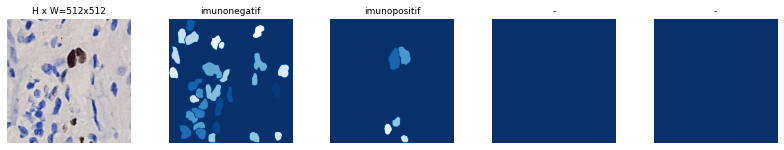

29
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/30.jpg


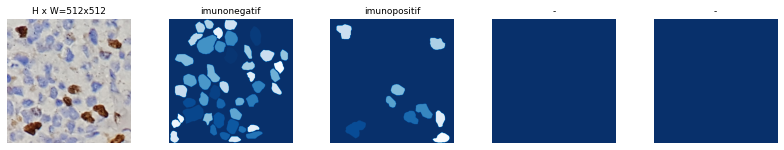

73
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/74.jpg


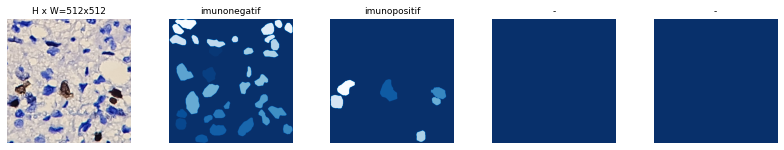

77
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/78.jpg


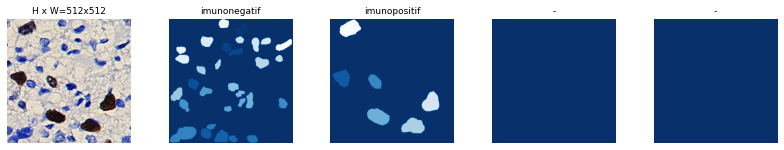

94
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/95.jpg


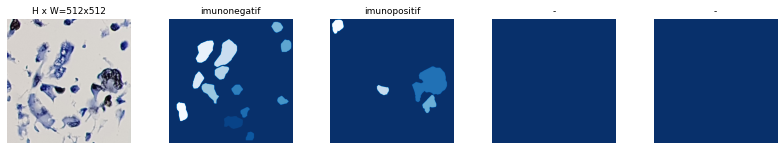

51
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/52.jpg


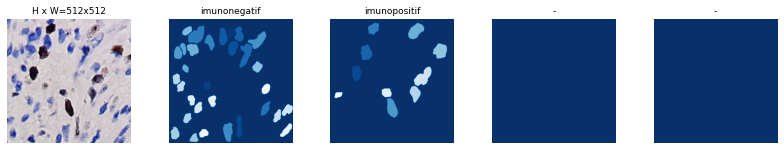

65
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/66.jpg


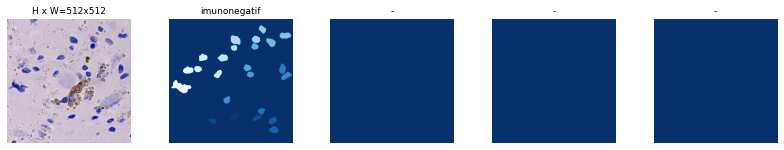

82
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/83.jpg


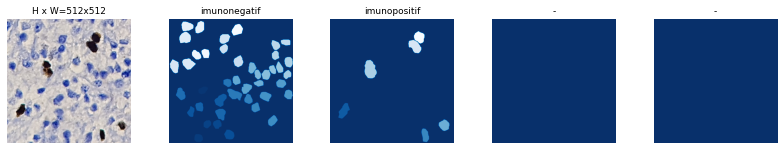

33
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/34.jpg


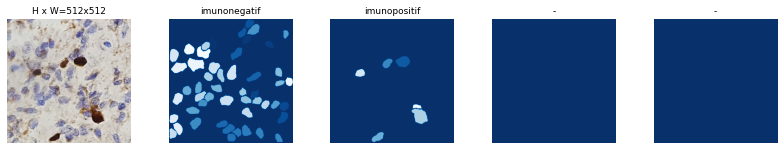

41
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/42.jpg


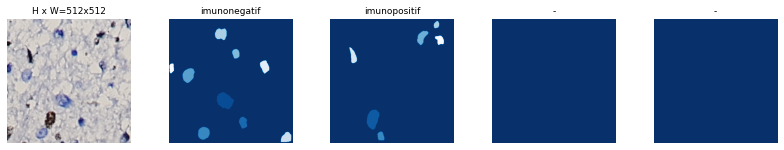

44
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/45.jpg


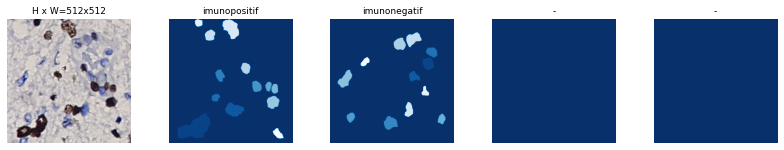

60
/content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/61.jpg


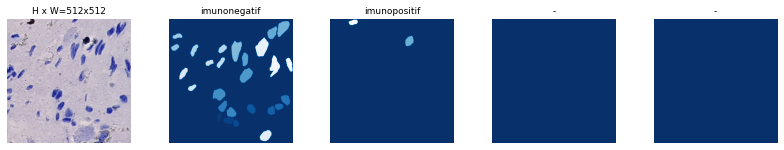

In [ ]:
# Menampilkan Contoh Dataset
dataset = dataset_train
image_ids = np.random.choice(dataset.image_ids, 20)
for image_id in image_ids:
    print(image_id)
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    print(dataset.image_reference(image_id))
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

image_id  56 /content/drive/MyDrive/Thesis Spesialis-1/dataset512/train/57.jpg
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
mask                     shape: (512, 512, 58)        min:    0.00000  max:    1.00000  uint8
class_ids                shape: (58,)                 min:    1.00000  max:    2.00000  int32
bbox                     shape: (58, 4)               min:    1.00000  max:  511.00000  int32


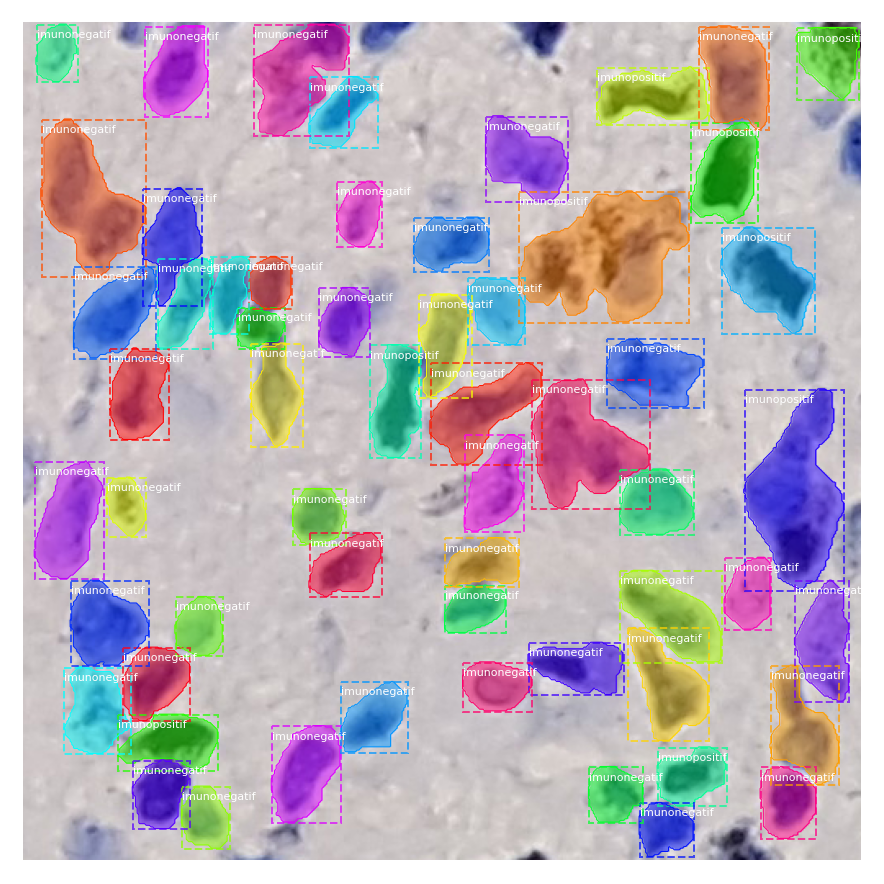

In [ ]:
from mrcnn.model import log

image_id = random.choice(dataset.image_ids) #6
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Tampilkan Bounding Box
bbox = utils.extract_bboxes(mask)

# Tampilkan Contoh Gambar dan Contoh Data
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Tampilan Kelas Tumor Imunopositif dan Negatif
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

Proses training

In [ ]:
model.train(dataset_train, dataset_val, 
            learning_rate=0.001, 
            epochs=10, 
            layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: /content/thesis/logs/object20210617T0226/mask_rcnn_object_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_deconv      (Tim

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Epoch 1/10


/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:449: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/sub:0", shape=(None,), dtype=int32), values=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/GatherV2_2:0", shape=(None, 7, 7, 256), dtype=float32), dense_shape=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/Shape:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "shape. This may consume a large amount of memory." % value)
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:449: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_grad/sub_1:0", shape=(None,), dtype=int32), values=Tensor("training/SGD/gradients/gradients/roi_align_cl

500/500 [==============================] - ETA: 0s - batch: 249.5000 - size: 1.0000 - loss: 1.5902 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.6252 - mrcnn_class_loss: 0.2932 - mrcnn_bbox_loss: 0.3105 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


500/500 [==============================] - 271s 466ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.5902 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.6252 - mrcnn_class_loss: 0.2932 - mrcnn_bbox_loss: 0.3105 - mrcnn_mask_loss: 0.2709 - val_loss: 1.1371 - val_rpn_class_loss: 0.0397 - val_rpn_bbox_loss: 0.4794 - val_mrcnn_class_loss: 0.1639 - val_mrcnn_bbox_loss: 0.2095 - val_mrcnn_mask_loss: 0.2445
Epoch 2/10
500/500 [==============================] - 217s 434ms/step - batch: 249.5000 - size: 1.0000 - loss: 1.1387 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.4324 - mrcnn_class_loss: 0.2172 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2358 - val_loss: 1.2063 - val_rpn_class_loss: 0.0395 - val_rpn_bbox_loss: 0.4797 - val_mrcnn_class_loss: 0.1725 - val_mrcnn_bbox_loss: 0.2535 - val_mrcnn_mask_loss: 0.2611
Epoch 3/10
500/500 [==============================] - 218s 436ms/step - batch: 249.5000 - size: 1.0000 - loss: 0.9698 - rpn_class_loss: 0.0400 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss

Menyimpan Seluruh Log ke Google Drive

In [ ]:
!cp -r "/content/thesis/logs/" "/content/drive/MyDrive/Thesis Spesialis-1/dataset512"

# F. **Inferensi** (Inferensi)

Konfigurasi parameter proses inferensi

In [ ]:
# Konfigurasi Inferensi
class InferenceConfig(CustomConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    #DETECTION_MIN_CONFIDENCE = 0.85
    DETECTION_MIN_CONFIDENCE = 0.6
    
inference_config = InferenceConfig()


Memuat ulang model dalam mode inferensi

In [ ]:
# Muat Ulang Model dalam Mode Inferensi
model = modellib.MaskRCNN(mode="inference", config=inference_config,  model_dir=MODEL_DIR)

Instructions for updating:
Use fn_output_signature instead


Lokasi hasil training terakhir

In [ ]:
# Path Hasil Training Terakhir
model_path = os.path.join(ROOT_DIR, "/content/thesis/logs/object20210617T0226/mask_rcnn_object_0010.h5")
#model_path = model.find_last()

assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /content/thesis/logs/object20210617T0226/mask_rcnn_object_0010.h5
Re-starting from epoch 10


Proses deteksi (121 image dengan dimensi 512x512 px)

In [ ]:
import skimage
import matplotlib.pyplot as plt

real_test_dir = '/content/drive/MyDrive/Thesis Spesialis-1/dataset512/test'
image_paths = []
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=1)
    r = results[0]
    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                dataset_val.class_names, r['scores'], figsize=(5,5))

Output hidden; open in https://colab.research.google.com to view.

# G. **Logging** (Statistik Training - Tensor Board)

In [ ]:
import tensorflow as tf

In [ ]:
#Konfigurasi TensorBoard
logdir = "/content/thesis/logs" 
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir '/content/thesis/logs'

Output hidden; open in https://colab.research.google.com to view.

# H. **Confusion** **Matrix**

In [ ]:
import numpy as np
import utils

In [ ]:
gt_tot = np.array([])
pred_tot = np.array([])
#mAP list
mAP_ = []
#hitung gt_tot, pred_tot dan mAP untuk setiap test image
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id) #, use_mini_mask=False)
    info = dataset.image_info[image_id]

    # Jalankan model
    results = model.detect([image], verbose=1)
    r = results[0]
    
    #hitung gt_tot dan pred_tot
    gt, pred = utils.gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
    gt_tot = np.append(gt_tot, gt)
    pred_tot = np.append(pred_tot, pred)
    
    #precision_, recall_, AP_ 
    AP_, precision_, recall_, overlap_ = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
    #check if the vectors len are equal
    print("the actual len of the gt vect is : ", len(gt_tot))
    print("the actual len of the pred vect is : ", len(pred_tot))
    
    mAP_.append(AP_)
    print("Average precision of this image : ",AP_)
    print("The actual mean average precision for the whole images (matterport methode) ", sum(mAP_)/len(mAP_))
    #print("Ground truth object : "+dataset.class_names[gt])
    #print("Predicted object : "+dataset.class_names[pred])
  
gt_tot=gt_tot.astype(int)
pred_tot=pred_tot.astype(int)
#save the vectors of gt and pred
save_dir = "output"
gt_pred_tot_json = {"gt_tot" : gt_tot, "pred_tot" : pred_tot}
df = pd.DataFrame(gt_pred_tot_json)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
df.to_json(os.path.join(save_dir,"gt_pred_test.json"))

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -116.80000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


ValueError: ignored

/content/thesis/utils.py:1201: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/content/thesis/utils.py:1202: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False
/content/thesis/utils.py:1204: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  t.tick1On = False
/content/thesis/utils.py:1205: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  t.tick2On = False


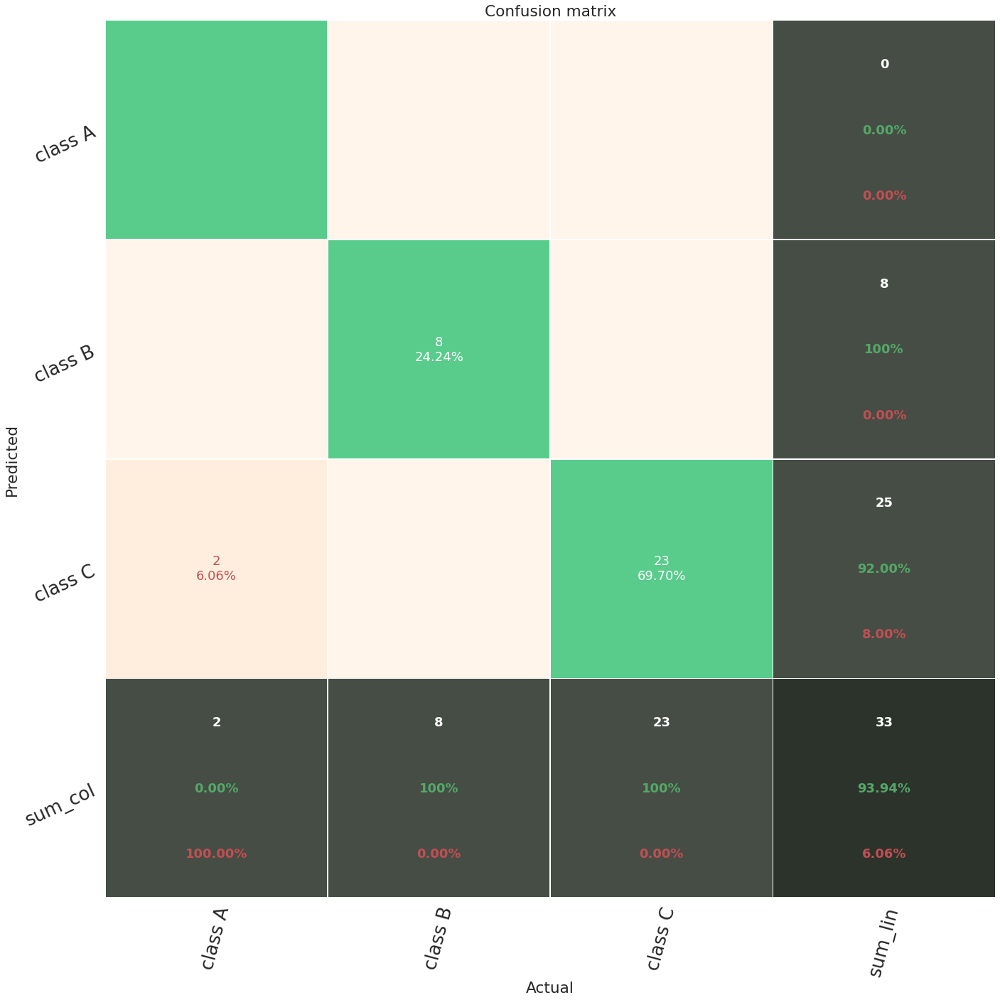

In [ ]:
tp,fp,fn=utils.plot_confusion_matrix_from_data(gt_tot,pred_tot,fz=18, figsize=(20,20), lw=0.5)

# I. **Kalkulasi IoU** (*Intersection over Union*)

In [49]:
!python setup.py install

/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:694: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:694: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:694: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
reading manifest template 'MANIFEST.in'
adding licens

In [50]:
import os
import json
import numpy as np
import skimage.draw
from mrcnn import visualize
from mrcnn.config import Config
from mrcnn import model as modellib, utils
import skimage
import matplotlib.pyplot as plt

In [51]:
class_names = ['BG', 'imunopositif', 'imunonegatif']
real_test_dir = 'd/content/drive/MyDrive/Thesis Spesialis-1/dataset512/test'
min_confidence = 0.6

class CascoConfig(Config):

    NAME = "object"

    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    NUM_CLASSES = 1 + 2 

    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    STEPS_PER_EPOCH = 500

    VALIDATION_STEPS = 5
    
    BACKBONE = 'resnet101'

    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 
    
config = CascoConfig()
config.display()

class InferenceConfig(CascoConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    #IMAGE_MIN_DIM = 512
    #IMAGE_MAX_DIM = 512
    DETECTION_MIN_CONFIDENCE = min_confidence
    
inference_config = InferenceConfig()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

In [52]:
class CustomDataset(utils.Dataset):
 
    def load_custom(self, dataset_dir, subset):

        # Multiclass untuk deteksi sel tumor imunopositif dan negatif
        self.add_class("object", 1, "imunopositif")
        self.add_class("object", 2, "imunonegatif")
 
        # Training dan validation dataset
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)
 
        annotations1 = json.load(open(os.path.join(dataset_dir, "via_region_data.json")))
        # print(annotations1)
        annotations = list(annotations1.values())
 
        annotations = [a for a in annotations if a['regions']]
 
        for a in annotations:
          
            polygons = [r['shape_attributes'] for r in a['regions'].values()]
            objects = [s['region_attributes']['tumor'] for s in a['regions'].values()]
            name_dict = {"imunopositif": 1,"imunonegatif": 2}
            num_ids = [name_dict[a] for a in objects]
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]
 
            self.add_image(
                "object", 
                image_id=a['filename'], 
                path=image_path,
                width=width, height=height,
                polygons=polygons,
                num_ids=num_ids)
 
    def load_mask(self, image_id):

        image_info = self.image_info[image_id]
        if image_info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
 
        info = self.image_info[image_id]
        if info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
        num_ids = info['num_ids']
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
 
        num_ids = np.array(num_ids, dtype=np.int32)
        return mask, num_ids
 
    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "object":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)
 

In [54]:
model_filename = "mask_rcnn_object_0010.h5"

model = modellib.MaskRCNN(mode="inference", config=inference_config,  model_dir='logs')


model_path = "/content/thesis/logs/object20210617T0226/mask_rcnn_object_0010.h5" #os.path.join('logs', model_filename)


assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /content/thesis/logs/object20210617T0226/mask_rcnn_object_0010.h5
Re-starting from epoch 10


In [55]:

def IoU_function(mask_real, mask_results,plot_results=True):
    
    annotation_mask = np.zeros((mask_real.shape[0], mask.shape[1]))
    for i in range(mask_real.shape[2]):
        annotation_mask = np.logical_or(annotation_mask, mask_real[:,:,i])
        #plt.imshow(annotation_mask,cmap='binary')
        #plt.show()
        
    result_mask = np.zeros((mask_results.shape[0], mask_results.shape[1]))
    for i in range(r['masks'].shape[2]):
        result_mask = np.logical_or(result_mask, mask_results[:,:,i])
        #plt.imshow(result_mask, cmap='binary')
        #plt.show()
    
    if(plot_results):
        plt.title('Annotation Mask')
        plt.imshow(annotation_mask,cmap='binary')
        plt.show()
     
        plt.title('Result Mask')
        plt.imshow(result_mask, cmap='binary')
        plt.show()
        
    intersection = np.logical_and(annotation_mask, result_mask)
    union = np.logical_or(annotation_mask, result_mask)
    
    IoU = np.sum(intersection) / np.sum(union)
    
    if(plot_results):
        colors = visualize.random_colors(2)
        IoU_image = visualize.apply_mask(image, intersection,(1.0, 0.0, 0.0), alpha=0.8)
        IoU_image = visualize.apply_mask(IoU_image, union, (0.0, 1.0, 0.0), alpha=0.3)
        plt.figure(figsize = (10,10))
        plt.text(20, 30, 'Union',bbox=dict(facecolor='green', alpha=0.5))
        plt.text(20, 50, 'Intersection',bbox=dict(facecolor='red', alpha=0.5))
        plt.title('IoU Image - Intersection over Union')
        plt.imshow(IoU_image)
        plt.show()

    return IoU;


In [57]:
dataset_val = CustomDataset()
dataset_val.load_custom("/content/drive/MyDrive/Thesis Spesialis-1/dataset512", "val")
dataset_val.prepare()
IoU_list = []


for image_id in dataset.image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    #visualize.display_top_masks(image, mask, class_ids, dataset.class_names)
    
    results = model.detect([image], verbose=1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], figsize=(5,5))

    IoU = IoU_function(mask, r['masks'])
    IoU_list.append(IoU)
    print('IoU:',IoU)
    

Output hidden; open in https://colab.research.google.com to view.

Jumlah Sample Image: 97
Rerata IoU:  0.7515085479905325
Standar Deviasi:  0.05884258112245211


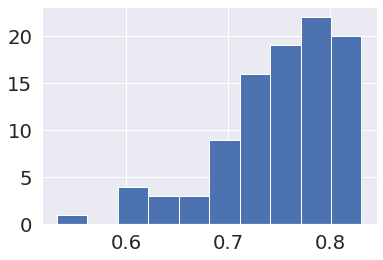

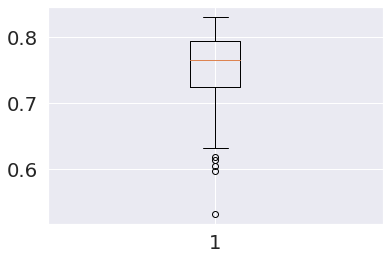

In [59]:
print('Jumlah Sample Image:', len(IoU_list))
print('Rerata IoU: ',np.mean(IoU_list))
print('Standar Deviasi: ', np.std(IoU_list))

plt.hist(IoU_list)
plt.show()

plt.boxplot(IoU_list)
plt.show()

### Matur sembah nuwun Bapak dan Dokter sekalian kulo nyuwun bimbingan dan arahan senantiasa - Salam hormat *m32*